# Prompt scale and cardinal-shift protocol

Part 1 selects 20 reproducible random test images with exactly one polygon. Part 2 selects 15 single-polygon images stratified by polygon area in the shared 512 frame: 5 small, 5 medium, and 5 large. Both parts visualize prompt scales x1 through x5, then fix scale x3 and compare six shift ratios in four cardinal directions.

In [1]:
# Setup: choose BTXRD or FracAtlas, clone main, and download the matching dataset.
import os, shutil, sys
from pathlib import Path

DATASET_NAME = 'BTXRD'  # Change to 'FracAtlas' when needed.
DATASET_IDS = {
    'BTXRD': '1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx',
    'FracAtlas': '1sfMPFQvADmZLCPJC3xPyYDrblnFZ4kQv',
}
if DATASET_NAME not in DATASET_IDS:
    raise ValueError(f'Unsupported dataset: {DATASET_NAME}')

BASE = Path('/kaggle/working') if Path('/kaggle/working').exists() else Path('/content')
REPO_ROOT = BASE / 'PGA_Unet2D'
PACKAGE_ROOT = REPO_ROOT / 'Source' / 'Prompt-Guided-XRay-Segmentation'
DATASET_DIR = PACKAGE_ROOT / f'dataset_{DATASET_NAME}'
ZIP_PATH = BASE / f'dataset_{DATASET_NAME}.zip'

!pip install -q gdown opencv-python matplotlib
if REPO_ROOT.exists():
    shutil.rmtree(REPO_ROOT)
!git clone -q --branch main --single-branch https://github.com/ThongLuc2k3/PGA_Unet2D.git {REPO_ROOT}

import gdown
if not ZIP_PATH.exists():
    gdown.download(id=DATASET_IDS[DATASET_NAME], output=str(ZIP_PATH), quiet=False)
extract_root = BASE / f'_extract_{DATASET_NAME}'
if extract_root.exists():
    shutil.rmtree(extract_root)
extract_root.mkdir(parents=True)
shutil.unpack_archive(str(ZIP_PATH), str(extract_root))
extracted_dataset = extract_root / f'dataset_{DATASET_NAME}'
if not extracted_dataset.exists():
    raise FileNotFoundError(f'Expected extracted dataset at {extracted_dataset}')
if DATASET_DIR.exists():
    shutil.rmtree(DATASET_DIR)
shutil.move(str(extracted_dataset), str(DATASET_DIR))
os.chdir(PACKAGE_ROOT)
print(f'Ready: {DATASET_DIR}')

Downloading...
From (original): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx
From (redirected): https://drive.google.com/uc?id=1Ep3w8GujpCQ5Qb6nlXKxXhsCxlc3k8gx&confirm=t&uuid=c87bba0d-74df-4759-95bf-6824e08c0bc2
To: /content/dataset_BTXRD.zip
100%|██████████| 1.71G/1.71G [00:11<00:00, 150MB/s]


Ready: /content/PGA_Unet2D/Source/Prompt-Guided-XRay-Segmentation/dataset_BTXRD


In [2]:
# Select reproducible single-polygon test images for both protocol parts.
import json, random
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np

RANDOM_SEED = 22120196
N_RANDOM_SHOW = 20
N_PER_SIZE_GROUP = 5
IMAGE_DIR = DATASET_DIR / 'test' / 'images'
ANNOTATION_DIR = DATASET_DIR / 'test' / 'annotations'

def polygon_shapes(annotation):
    return [
        shape for shape in annotation.get('shapes', [])
        if shape.get('shape_type', 'polygon') == 'polygon' and len(shape.get('points', [])) >= 3
    ]

candidates = []
for annotation_path in sorted(ANNOTATION_DIR.glob('*.json')):
    annotation = json.loads(annotation_path.read_text())
    polygons = polygon_shapes(annotation)
    if len(polygons) != 1:
        continue
    image_name = annotation.get('imagePath') or f'{annotation_path.stem}.png'
    image_path = IMAGE_DIR / Path(image_name).name
    if not image_path.exists():
        matches = sorted(IMAGE_DIR.glob(f'{annotation_path.stem}.*'))
        if not matches:
            continue
        image_path = matches[0]
    points = np.asarray(polygons[0]['points'], dtype=np.float32)
    candidates.append((image_path, annotation_path, points))

if len(candidates) < N_RANDOM_SHOW:
    raise RuntimeError(f'Only {len(candidates)} single-polygon test images are available')
selected = random.Random(RANDOM_SEED).sample(candidates, N_RANDOM_SHOW)
print('Part 1 random stems:', [item[0].stem for item in selected])

def polygon_area(points):
    x, y = points[:, 0], points[:, 1]
    return float(abs(np.dot(x, np.roll(y, 1)) - np.dot(y, np.roll(x, 1))) / 2.0)

def polygon_area_in_shared_frame(image_path, points, frame_size=512):
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(image_path)
    height, width = image.shape
    scale = frame_size / max(height, width)
    return polygon_area(points) * scale * scale

AREA_512_BY_STEM = {
    image_path.stem: polygon_area_in_shared_frame(image_path, points)
    for image_path, _, points in candidates
}
ranked_candidates = sorted(
    candidates, key=lambda item: AREA_512_BY_STEM[item[0].stem])
group_indices = np.array_split(np.arange(len(ranked_candidates)), 3)
size_rng = random.Random(RANDOM_SEED)
selected_stratified = []
SIZE_GROUP_BY_STEM = {}
for group_name, indices in zip(('Small', 'Medium', 'Large'), group_indices):
    group = [ranked_candidates[int(index)] for index in indices]
    if len(group) < N_PER_SIZE_GROUP:
        raise RuntimeError(f'{group_name} group has only {len(group)} images')
    chosen = size_rng.sample(group, N_PER_SIZE_GROUP)
    selected_stratified.extend(chosen)
    for image_path, _, _ in chosen:
        SIZE_GROUP_BY_STEM[image_path.stem] = group_name
    print(f'Part 2 {group_name.lower()} stems:', [item[0].stem for item in chosen])

def tight_box(points):
    x_min, y_min = points.min(axis=0)
    x_max, y_max = points.max(axis=0)
    return float(x_min), float(y_min), float(x_max), float(y_max)

def center_zoom_box(gt_box, scale, image_height, image_width):
    x_min, y_min, x_max, y_max = gt_box
    center_x, center_y = (x_min + x_max) / 2.0, (y_min + y_max) / 2.0
    half_width = (x_max - x_min) * scale / 2.0
    half_height = (y_max - y_min) * scale / 2.0
    return (
        max(0.0, center_x - half_width), max(0.0, center_y - half_height),
        min(float(image_width), center_x + half_width),
        min(float(image_height), center_y + half_height),
    )

def cardinal_shift_box(gt_box, scale, shift_ratio, direction, image_height, image_width):
    x_min, y_min, x_max, y_max = gt_box
    gt_width, gt_height = x_max - x_min, y_max - y_min
    bx_min, by_min, bx_max, by_max = center_zoom_box(
        gt_box, scale, image_height, image_width)
    dx = {'Right': gt_width * shift_ratio, 'Left': -gt_width * shift_ratio}.get(direction, 0.0)
    dy = {'Down': gt_height * shift_ratio, 'Up': -gt_height * shift_ratio}.get(direction, 0.0)
    bx_min = max(0.0, bx_min + dx)
    bx_max = min(float(image_width), bx_max + dx)
    by_min = max(0.0, by_min + dy)
    by_max = min(float(image_height), by_max + dy)
    # Match dataset.py: the shifted prompt must still cover the full GT.
    bx_min, by_min = min(bx_min, x_min), min(by_min, y_min)
    bx_max, by_max = max(bx_max, x_max), max(by_max, y_max)
    return bx_min, by_min, bx_max, by_max

def draw_case(ax, image, gt_box, prompt_box, title):
    ax.imshow(image, cmap='gray', vmin=0, vmax=255)
    gx0, gy0, gx1, gy1 = gt_box
    px0, py0, px1, py1 = prompt_box
    ax.add_patch(patches.Rectangle(
        (gx0, gy0), gx1 - gx0, gy1 - gy0,
        facecolor='cyan', edgecolor='cyan', alpha=0.30, linewidth=1.5))
    ax.add_patch(patches.Rectangle(
        (px0, py0), px1 - px0, py1 - py0,
        fill=False, edgecolor='red', linewidth=2.0))
    ax.set_title(title, fontsize=10, fontweight='bold')
    ax.axis('off')

Part 1 random stems: ['IMG000369', 'IMG001831', 'IMG001174', 'IMG000977', 'IMG001116', 'IMG000437', 'IMG000623', 'IMG001474', 'IMG000161', 'IMG000927', 'IMG001691', 'IMG000849', 'IMG000821', 'IMG000467', 'IMG001364', 'IMG001214', 'IMG000102', 'IMG001262', 'IMG001736', 'IMG000078']
Part 2 small stems: ['IMG001299', 'IMG000821', 'IMG001049', 'IMG001757', 'IMG001033']
Part 2 medium stems: ['IMG001583', 'IMG000534', 'IMG000315', 'IMG001161', 'IMG000188']
Part 2 large stems: ['IMG001691', 'IMG000098', 'IMG001614', 'IMG000102', 'IMG000201']


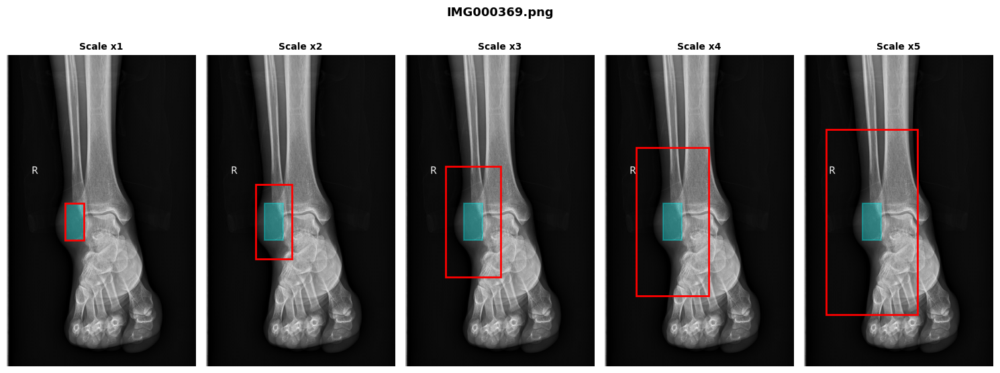

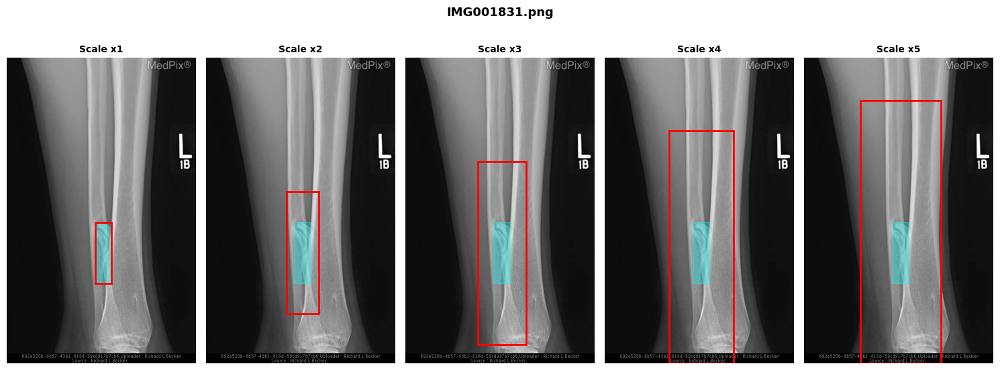

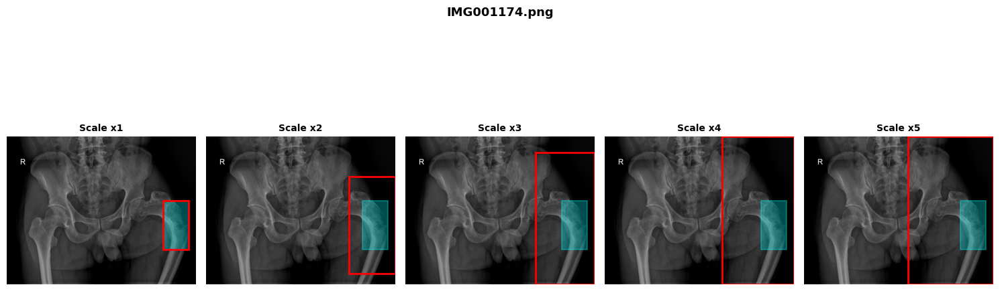

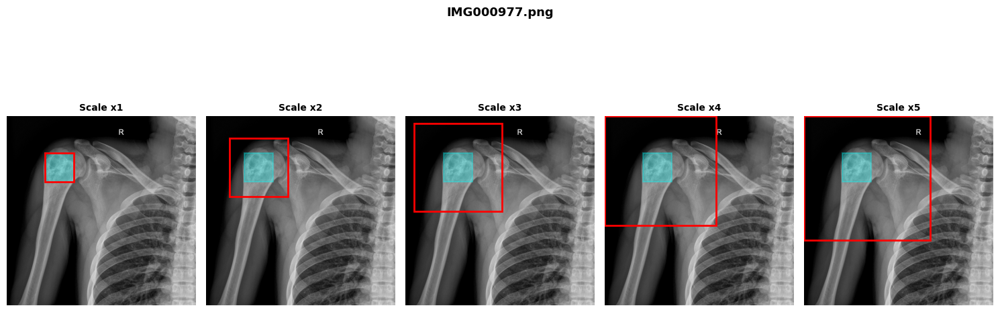

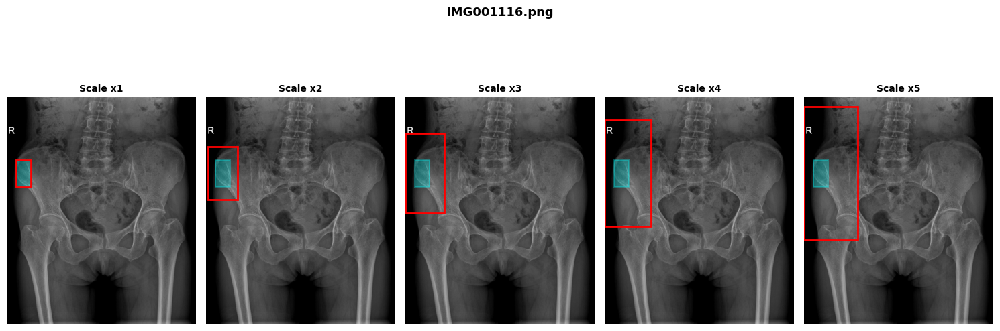

...

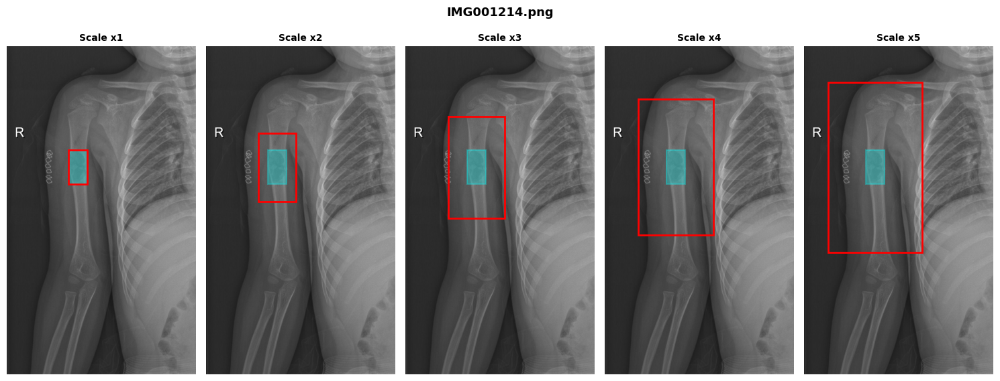

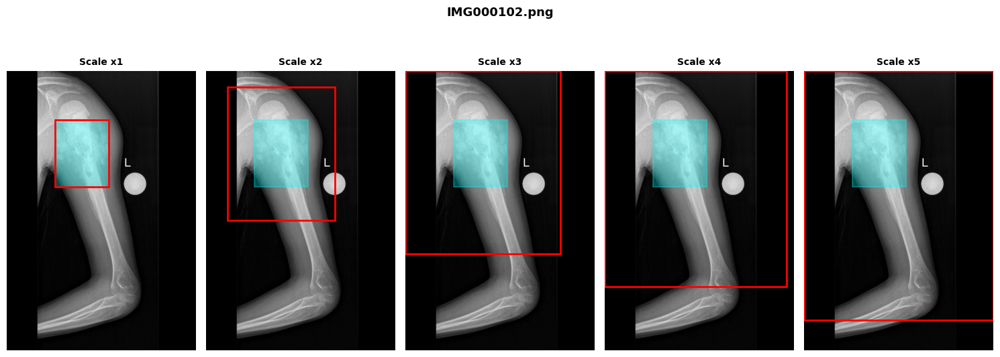

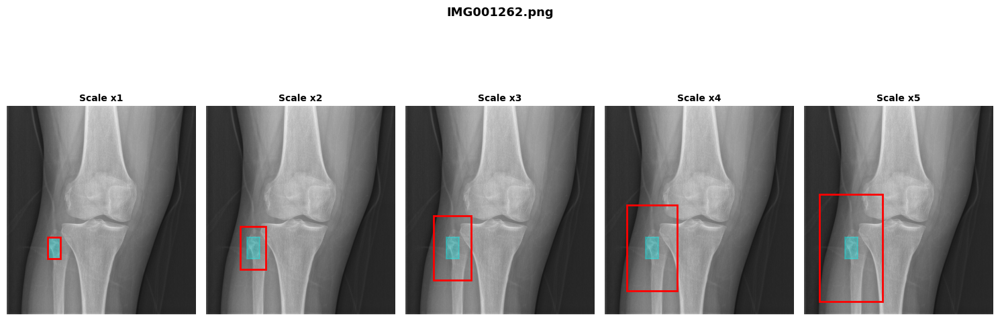

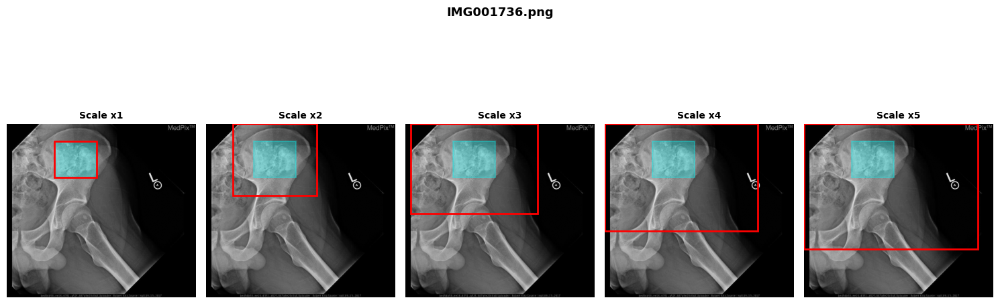

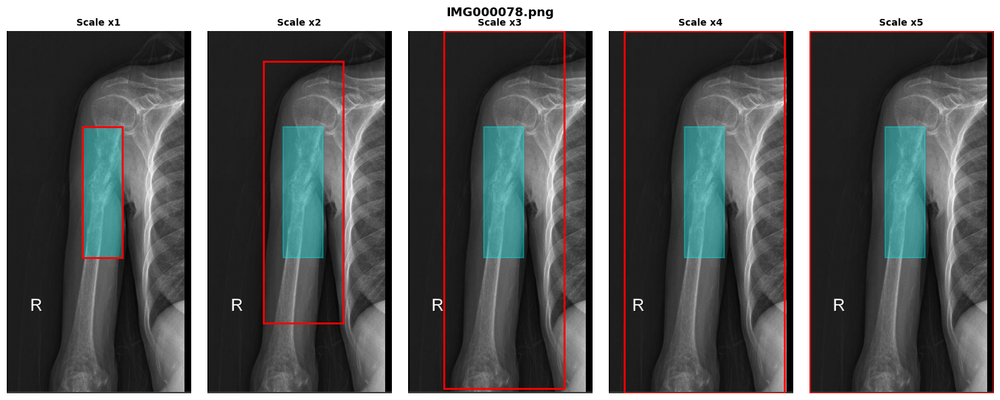

In [3]:
# Part 1A: prompt scale x1 through x5 for 20 random single-polygon images.
SCALES = [1, 2, 3, 4, 5]
for image_path, _, points in selected:
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(image_path)
    height, width = image.shape
    gt_box = tight_box(points)
    fig, axes = plt.subplots(1, len(SCALES), figsize=(15, 6), squeeze=False)
    for ax, scale in zip(axes[0], SCALES):
        prompt_box = center_zoom_box(gt_box, scale, height, width)
        draw_case(ax, image, gt_box, prompt_box, f'Scale x{scale}')
    fig.suptitle(image_path.name, fontsize=13, fontweight='bold')
    fig.tight_layout()
    plt.show()
    plt.close(fig)

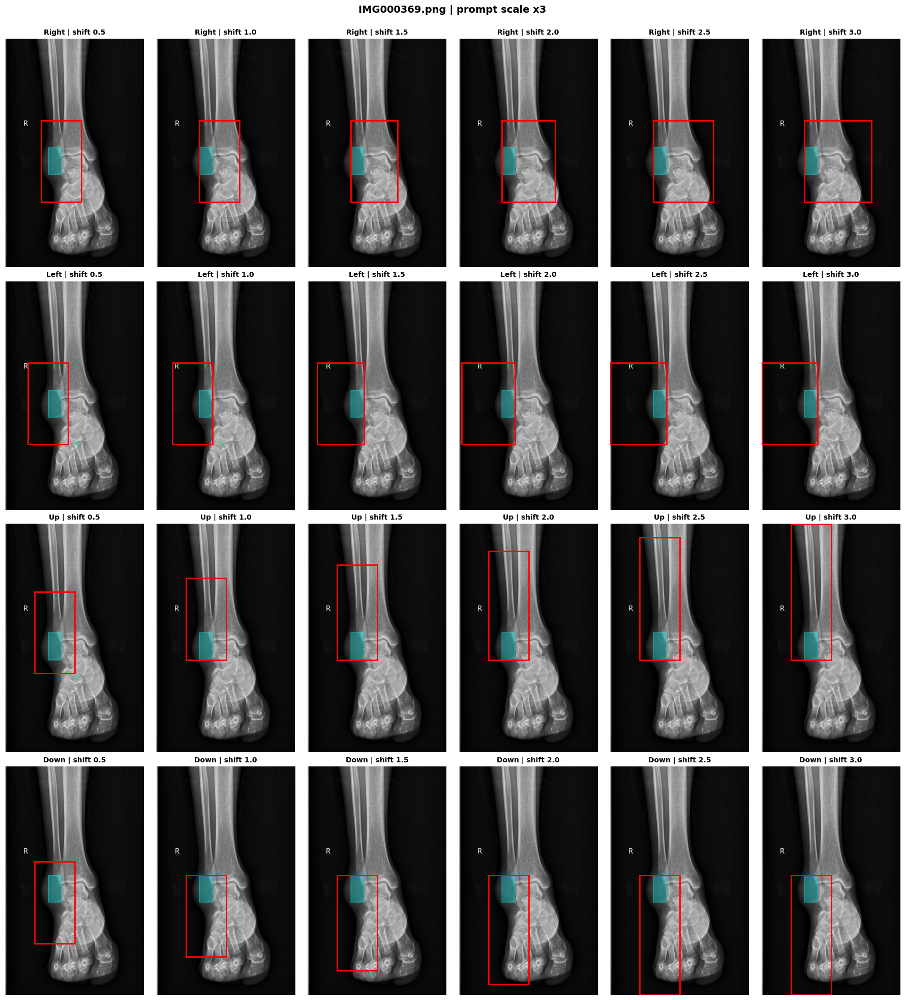

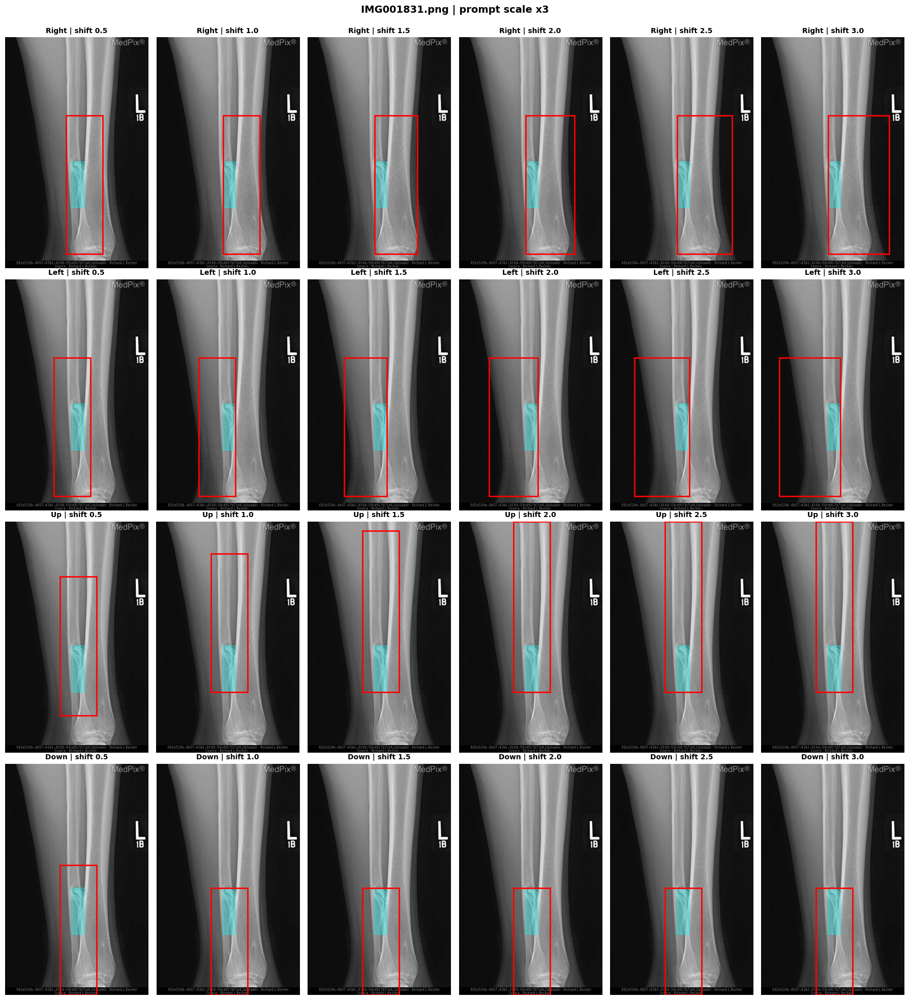

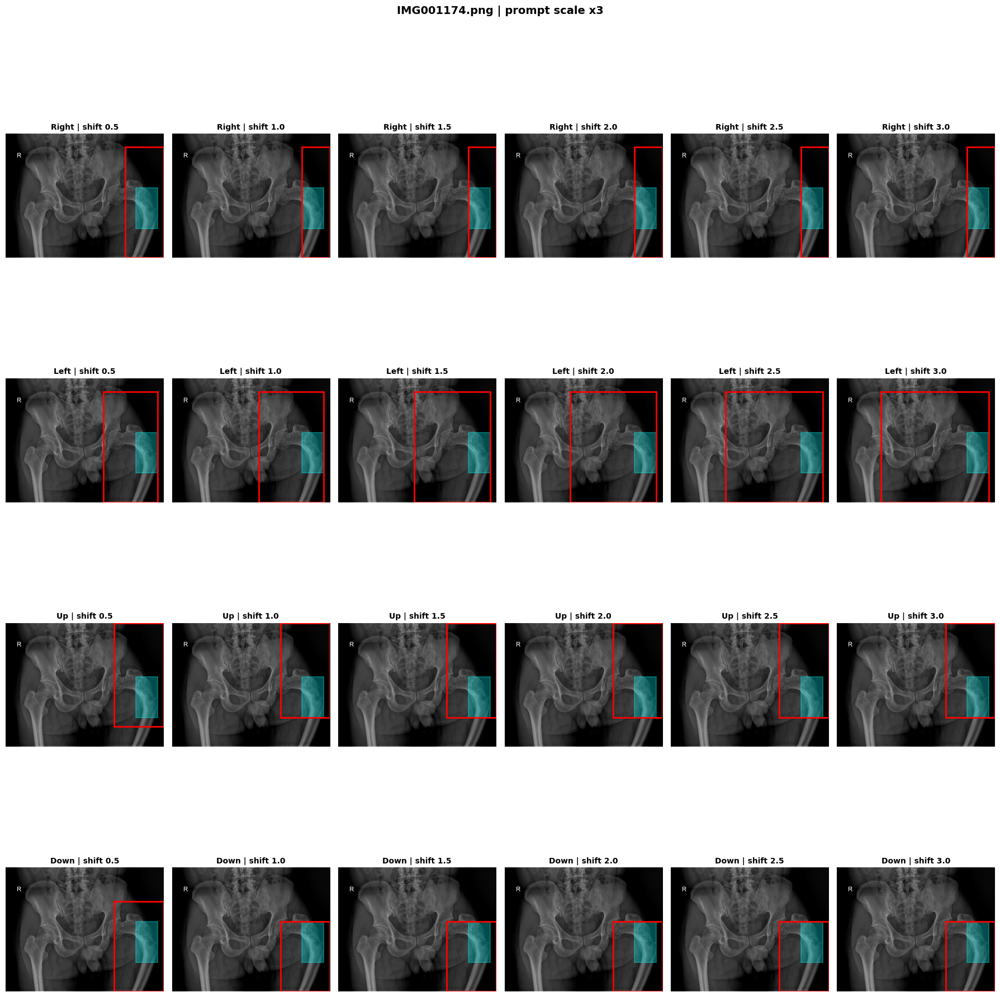

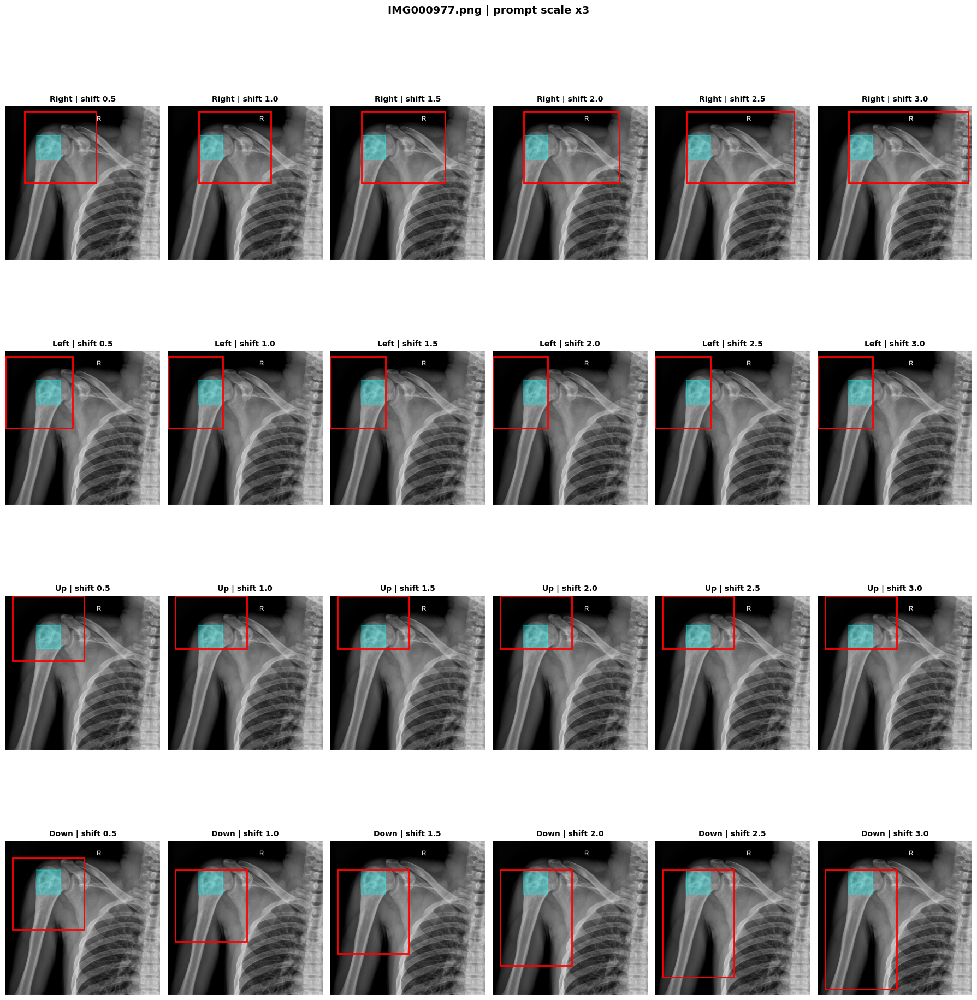

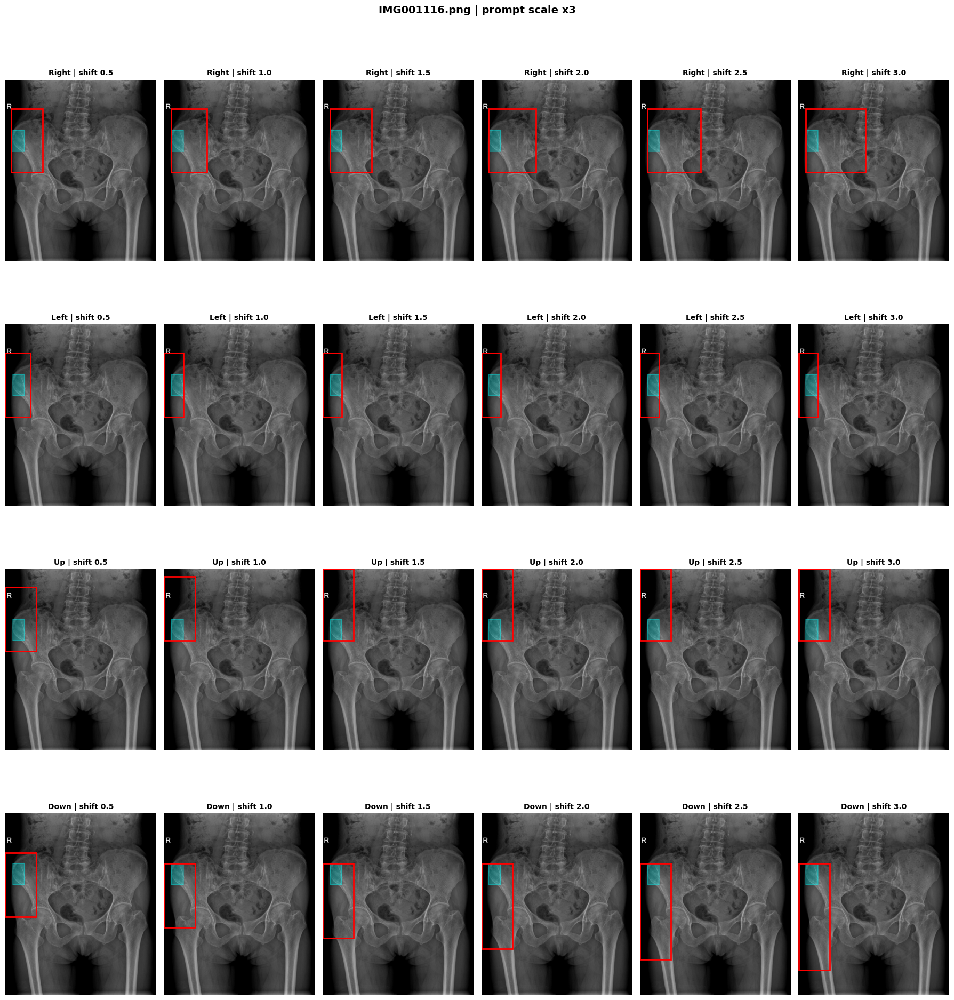

...

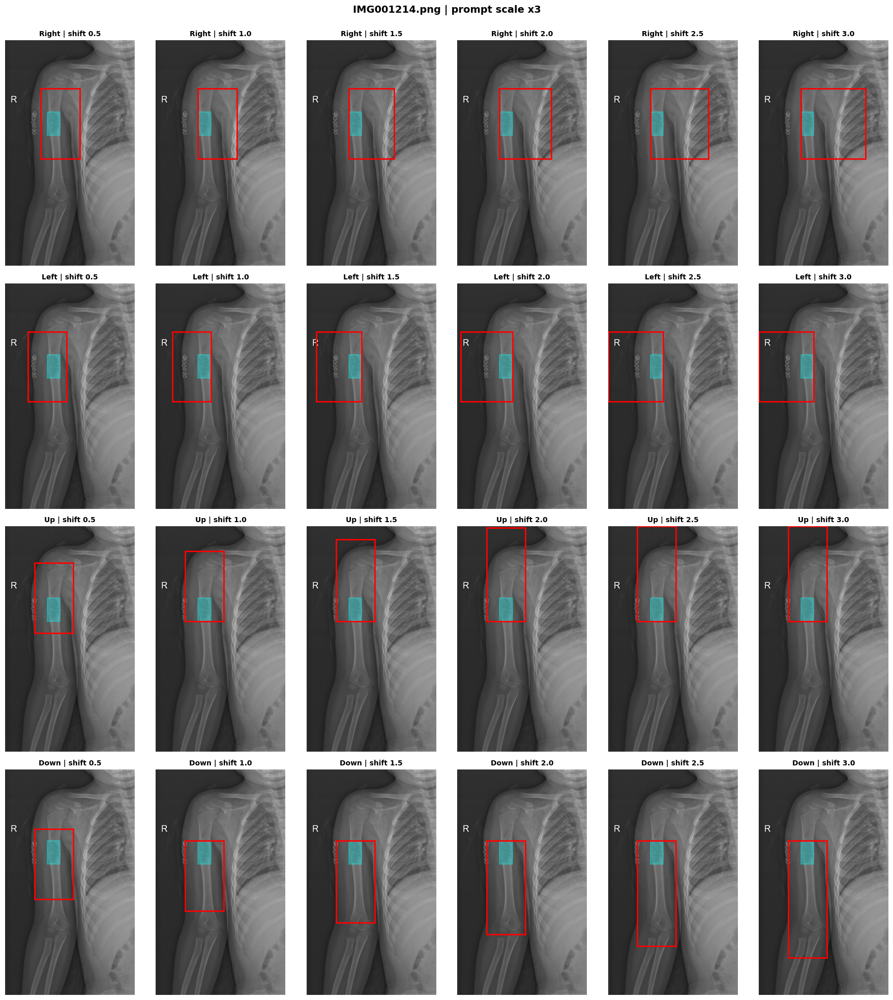

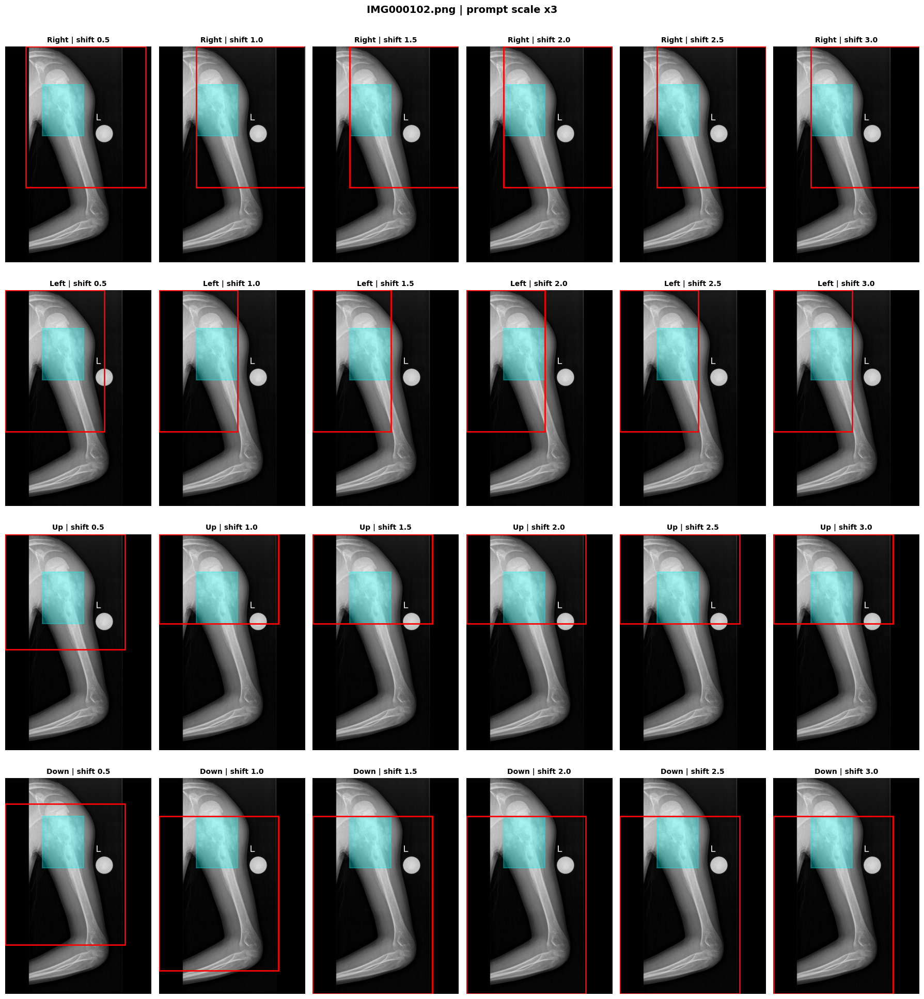

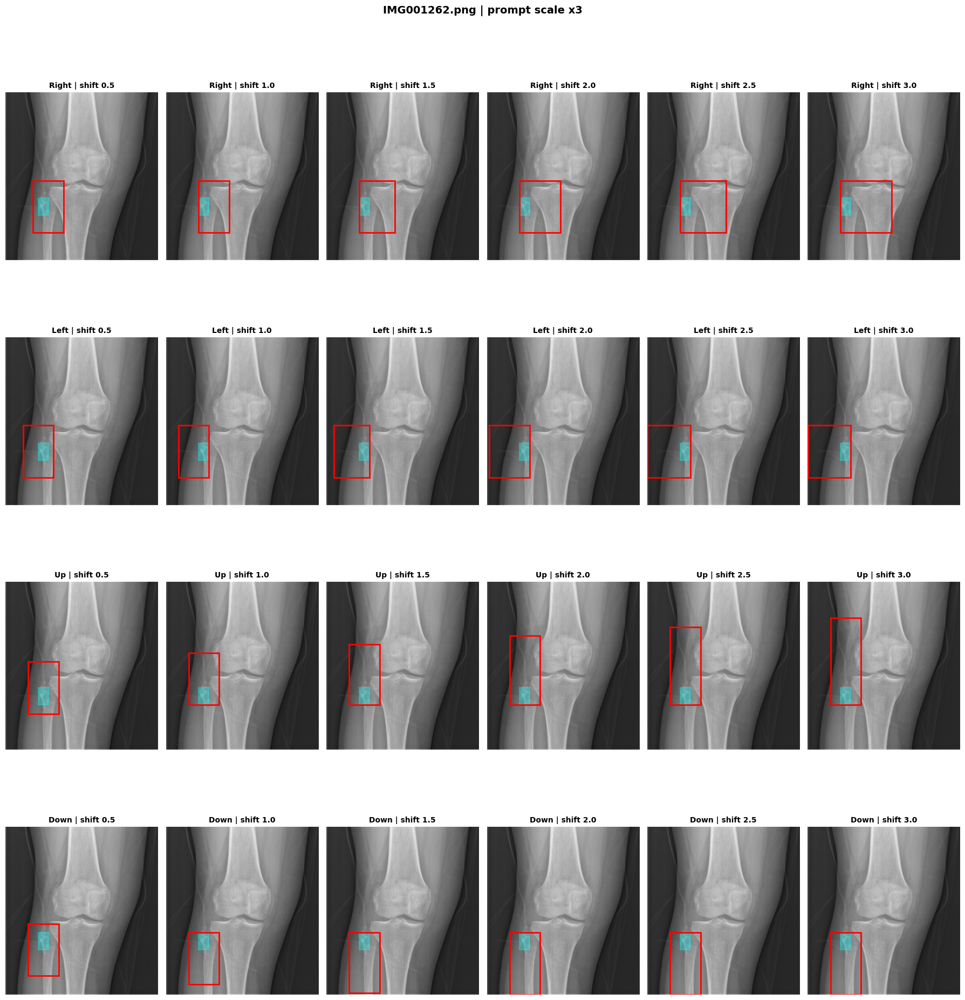

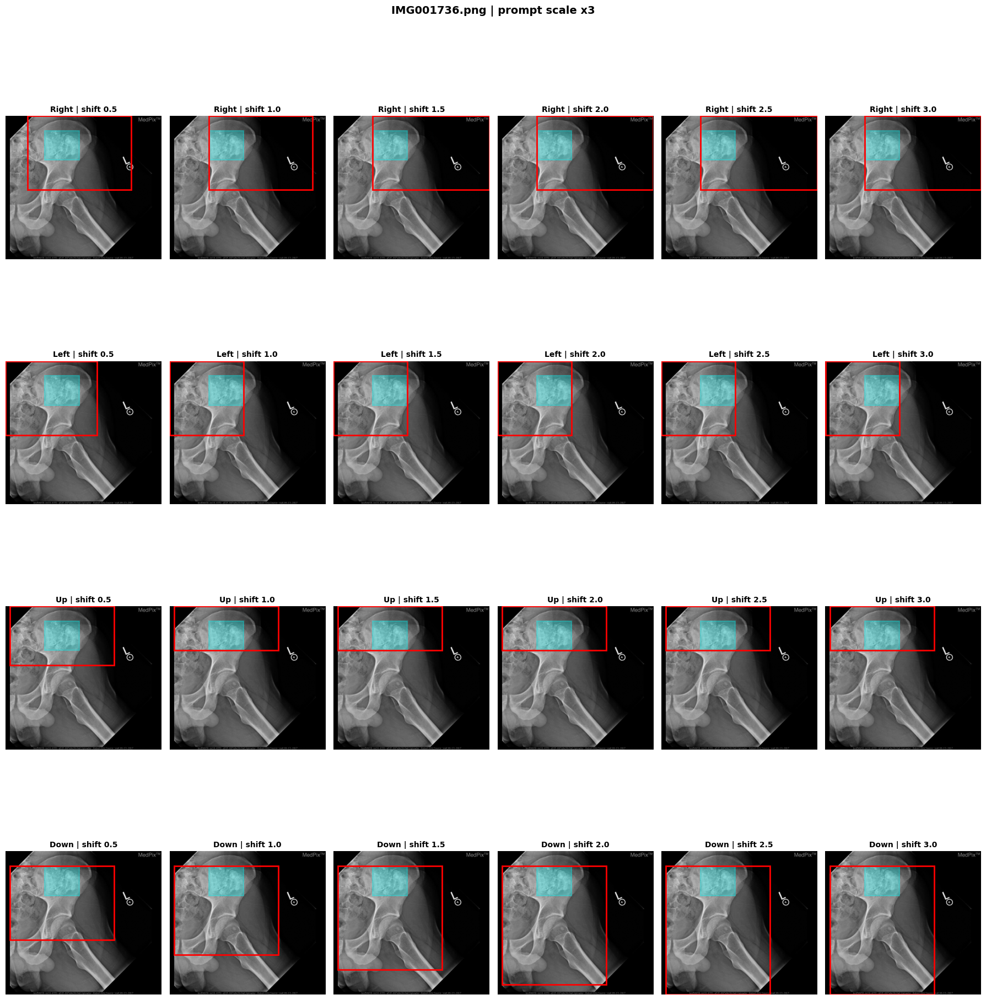

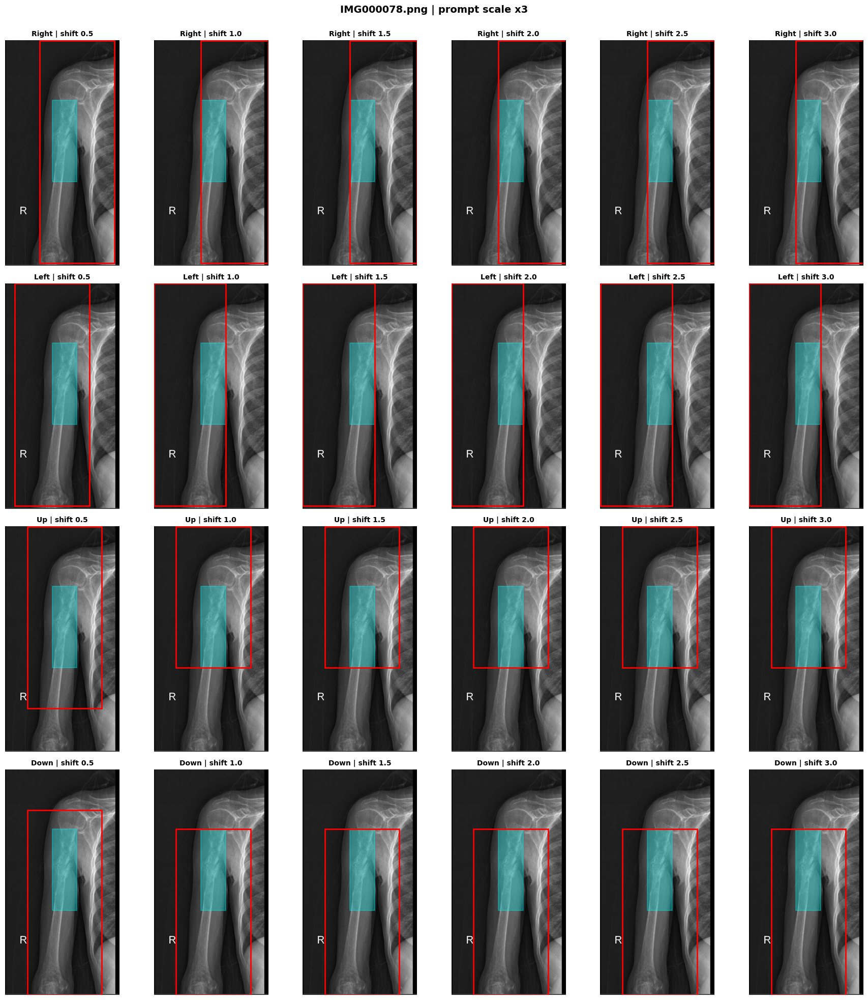

In [4]:
# Part 1B: scale x3 and cardinal shifts for the same 20 random images.
SHIFT_RATIOS = [0.5, 1.0, 1.5, 2.0, 2.5, 3.0]
DIRECTIONS = ['Right', 'Left', 'Up', 'Down']
for image_path, _, points in selected:
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(image_path)
    height, width = image.shape
    gt_box = tight_box(points)
    fig, axes = plt.subplots(
        len(DIRECTIONS), len(SHIFT_RATIOS), figsize=(18, 20), squeeze=False)
    for row, direction in enumerate(DIRECTIONS):
        for column, shift_ratio in enumerate(SHIFT_RATIOS):
            prompt_box = cardinal_shift_box(
                gt_box, 3.0, shift_ratio, direction, height, width)
            draw_case(
                axes[row, column], image, gt_box, prompt_box,
                f'{direction} | shift {shift_ratio:.1f}')
    fig.suptitle(f'{image_path.name} | prompt scale x3', fontsize=14, fontweight='bold')
    fig.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
    plt.close(fig)

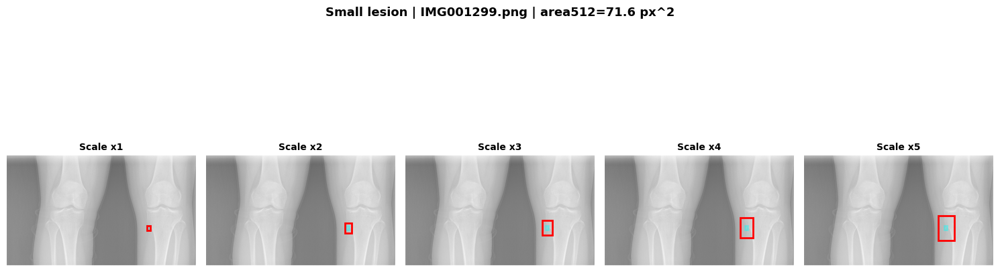

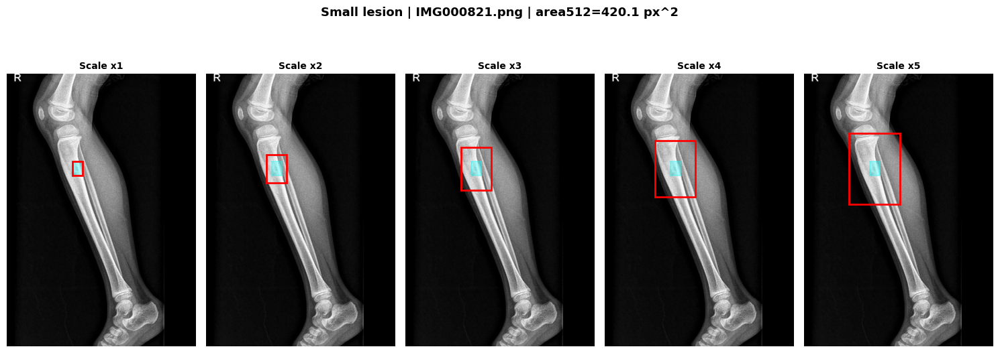

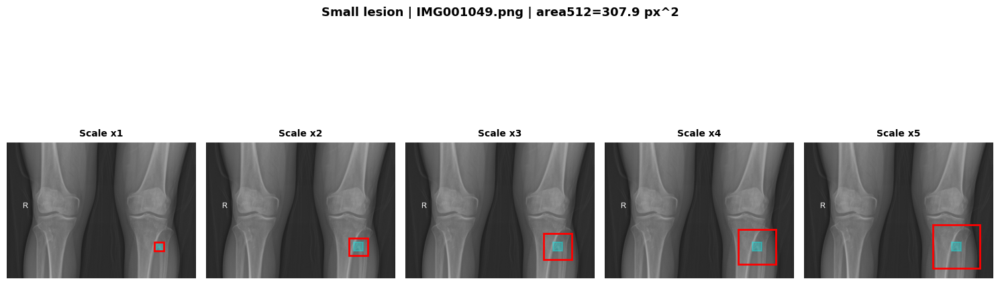

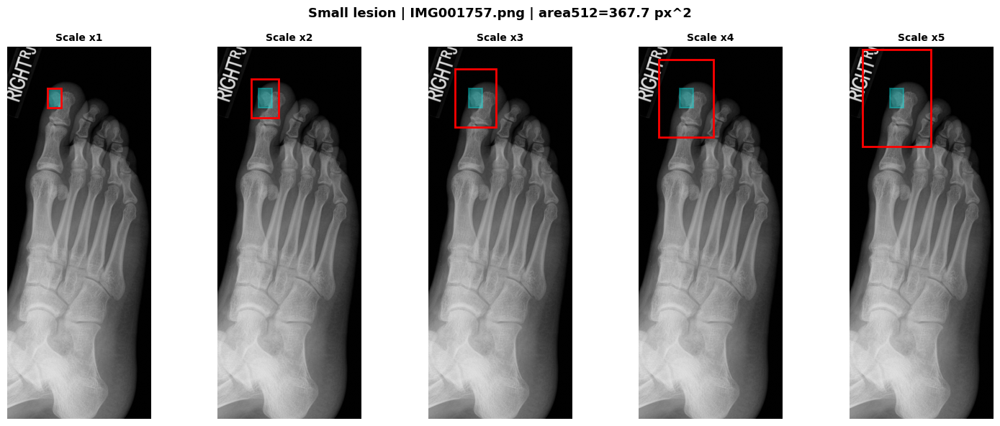

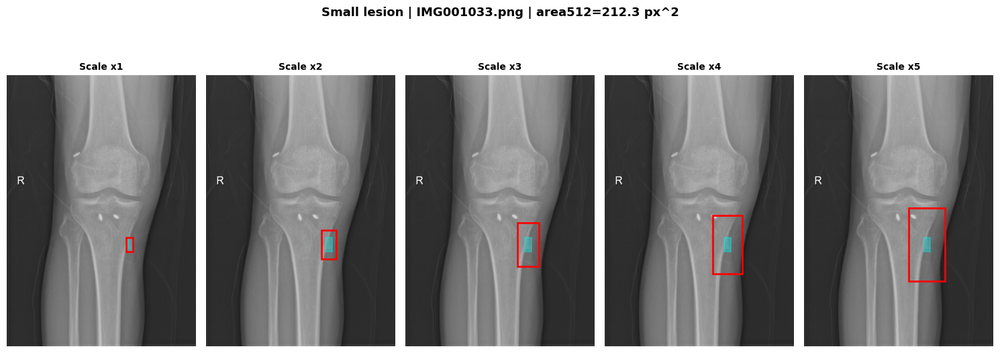

...

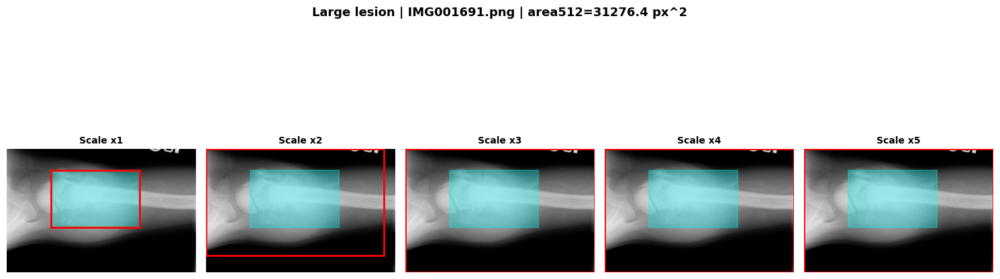

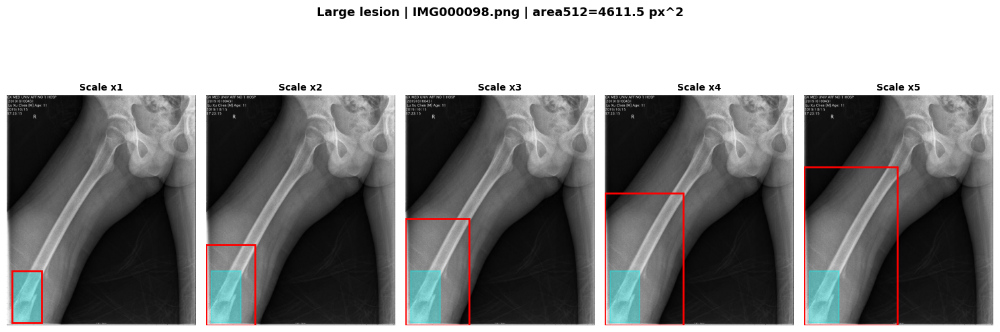

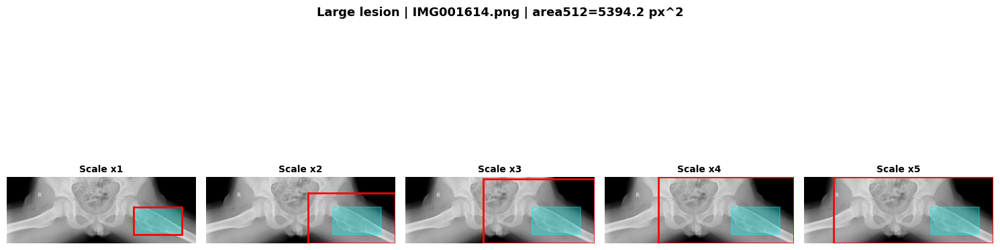

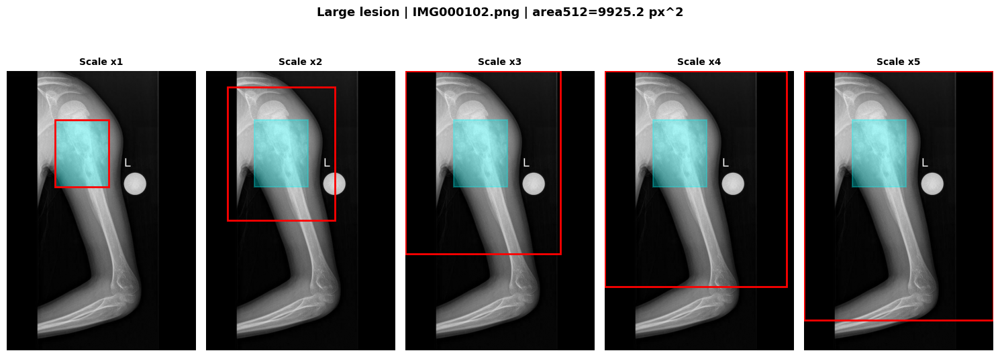

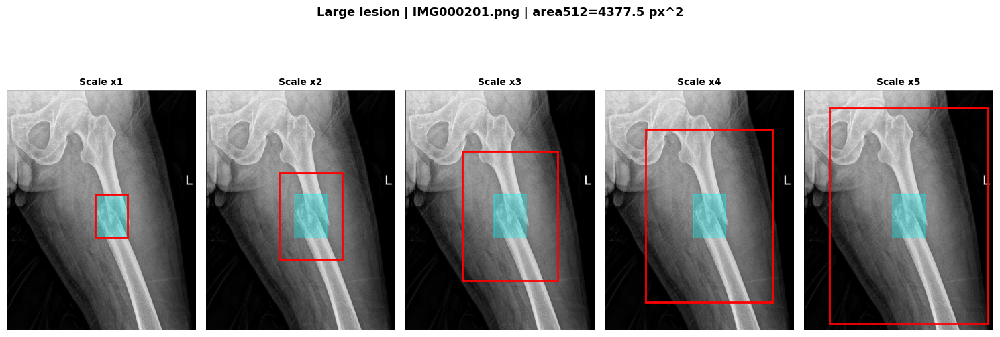

In [5]:
# Part 2A: prompt scale x1 through x5 for 5 small, 5 medium, and 5 large lesions.
for image_path, _, points in selected_stratified:
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(image_path)
    height, width = image.shape
    gt_box = tight_box(points)
    group_name = SIZE_GROUP_BY_STEM[image_path.stem]
    fig, axes = plt.subplots(1, len(SCALES), figsize=(15, 6), squeeze=False)
    for ax, scale in zip(axes[0], SCALES):
        prompt_box = center_zoom_box(gt_box, scale, height, width)
        draw_case(ax, image, gt_box, prompt_box, f'Scale x{scale}')
    fig.suptitle(
        f'{group_name} lesion | {image_path.name} | area512={AREA_512_BY_STEM[image_path.stem]:.1f} px^2',
        fontsize=13, fontweight='bold')
    fig.tight_layout()
    plt.show()
    plt.close(fig)

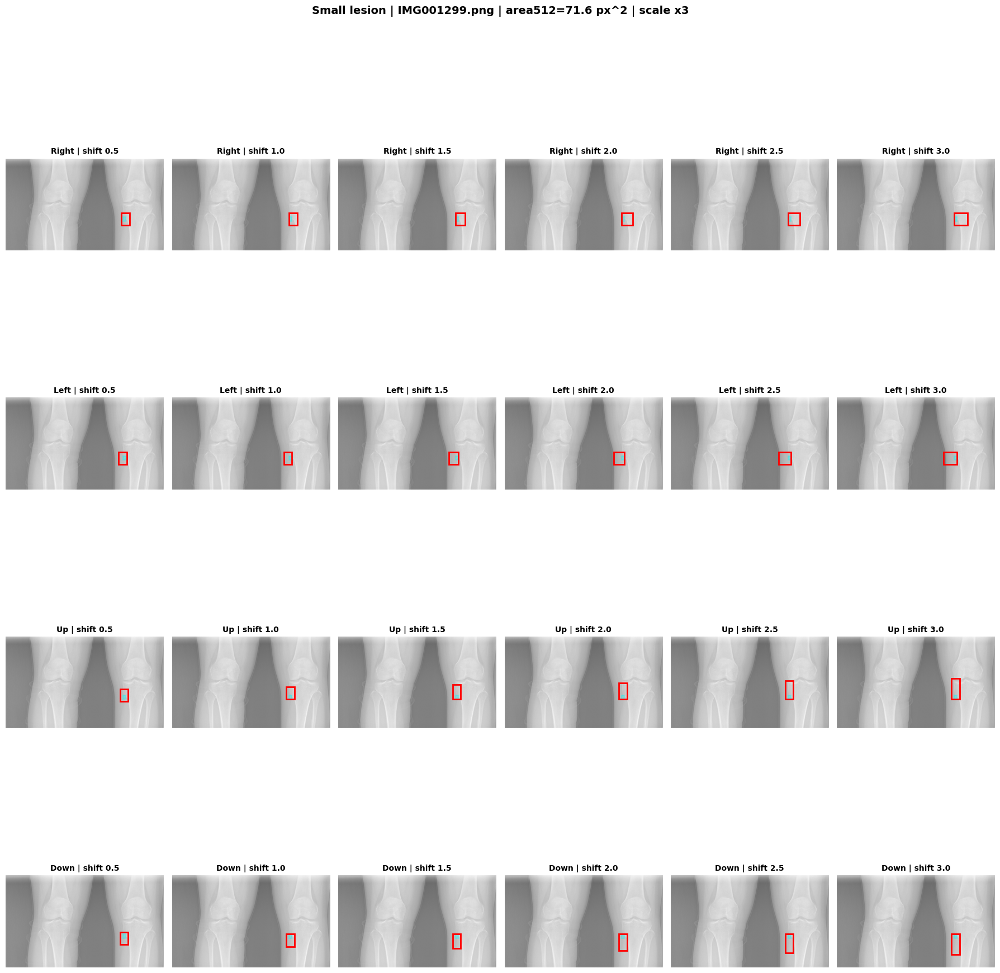

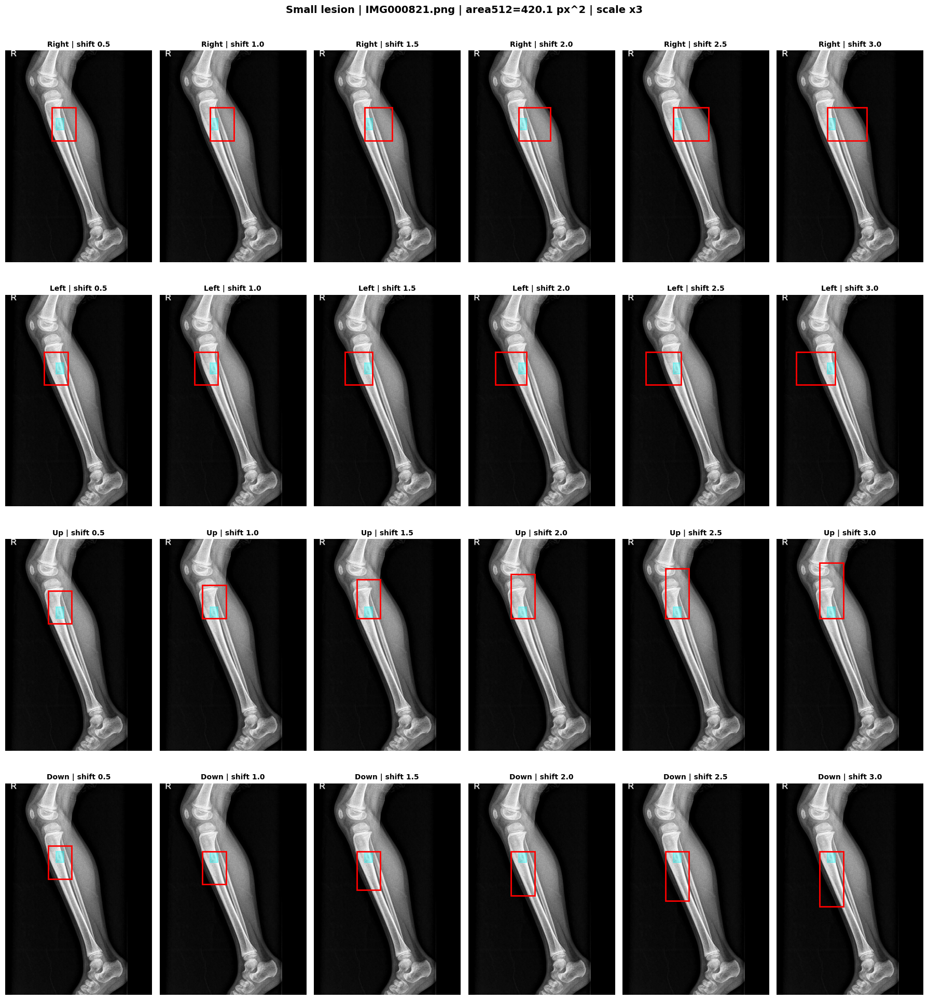

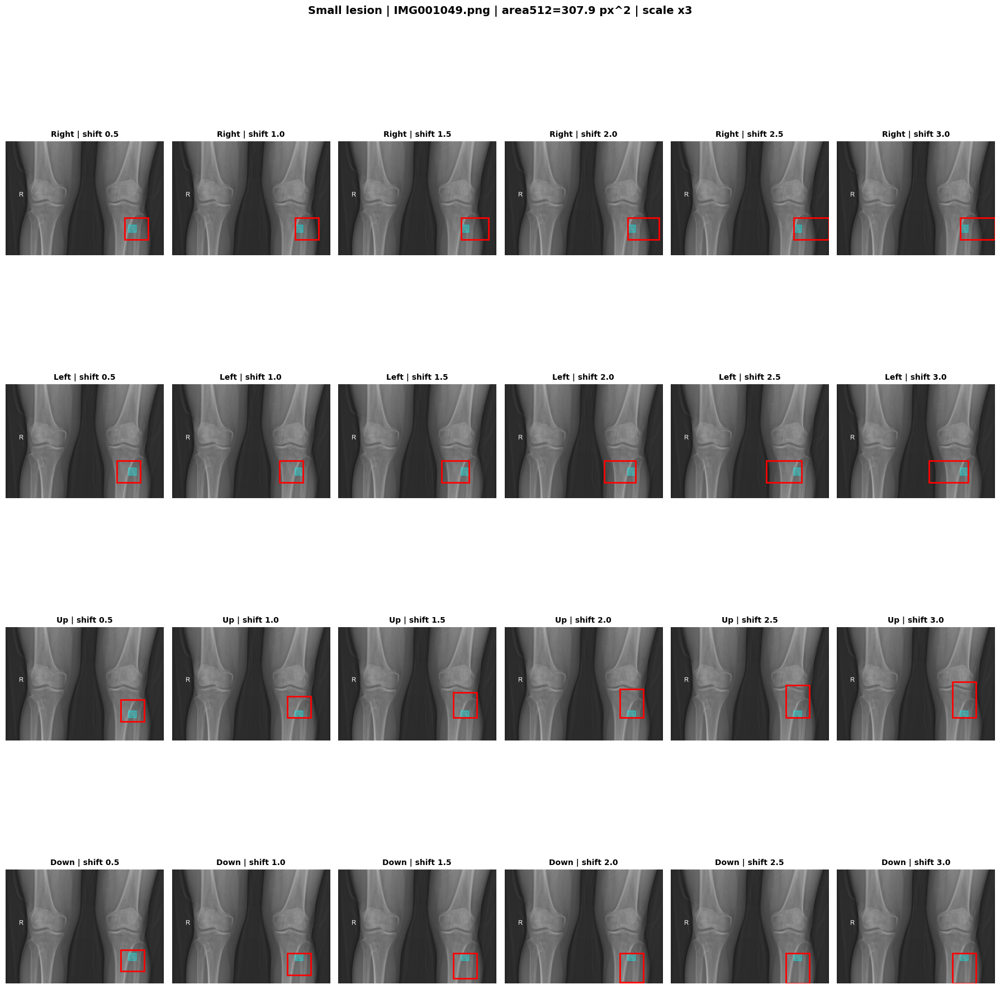

In [ ]:
# Part 2B: scale x3 and cardinal shifts for the same stratified 15 images.
for image_path, _, points in selected_stratified:
    image = cv2.imread(str(image_path), cv2.IMREAD_GRAYSCALE)
    if image is None:
        raise FileNotFoundError(image_path)
    height, width = image.shape
    gt_box = tight_box(points)
    group_name = SIZE_GROUP_BY_STEM[image_path.stem]
    fig, axes = plt.subplots(
        len(DIRECTIONS), len(SHIFT_RATIOS), figsize=(18, 20), squeeze=False)
    for row, direction in enumerate(DIRECTIONS):
        for column, shift_ratio in enumerate(SHIFT_RATIOS):
            prompt_box = cardinal_shift_box(
                gt_box, 3.0, shift_ratio, direction, height, width)
            draw_case(
                axes[row, column], image, gt_box, prompt_box,
                f'{direction} | shift {shift_ratio:.1f}')
    fig.suptitle(
        f'{group_name} lesion | {image_path.name} | area512={AREA_512_BY_STEM[image_path.stem]:.1f} px^2 | scale x3',
        fontsize=14, fontweight='bold')
    fig.tight_layout(rect=[0, 0, 1, 0.98])
    plt.show()
    plt.close(fig)